In [1]:
import pandas as pd 
import os
import matplotlib.pyplot as plt
import json
import mne
import numpy as np
from tqdm import tqdm
from mne.time_frequency import tfr_array_morlet
import re

mne.set_log_level('error')
os.chdir('../..')

In [2]:
subject_id = 6
trial_id = 1

eeg_clean_path = f"./Generated/Data/S_{subject_id}/Trial_{trial_id}/EEG_clean.fif"
experiment_path = f"./Generated/Data/S_{subject_id}/Trial_{trial_id}/Experiment.json"

# Load the .fif file
raw = mne.io.read_raw_fif(eeg_clean_path , preload=True, verbose=False)
raw.pick_types(eeg=True, verbose=False)  # только EEG-каналы
sr = int(raw.info['sfreq'])  # sampling rate

# Load experiment sequence
with open(experiment_path,'r') as f:
    experiment_seq = json.load(f)


/tmp/ipykernel_42966/3791197515.py:8: RuntimeWarning: This filename (./Generated/Data/S_6/Trial_1/EEG_clean.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(eeg_clean_path , preload=True, verbose=False)


# Execution Vs Rest Blocks
Seems like the dependency between these types of blocks is complex.

### Get the fragments of rest and execution only:

In [3]:
# Get only execution and Rest blocks
execution_times = [
    (block_data['timestamp'], block_data['content']['duration'], )
    for block_data in experiment_seq.values()
    if block_data['type'] == 'execution'
]
rest_times = [
    (block_data['timestamp'], block_data['content']['duration'])
    for block_data in experiment_seq.values()
    if block_data['type'] == 'rest' and block_data['content']['duration'] == 10
]

# rest_times = rest_times[12:18]
# execution_times = execution_times[14:21]

# Соберем отрезки с execution и rest
execution_epochs = []
for start_time, duration in execution_times:
    start_sample = int(start_time)
    stop_sample = min(int((start_time + duration)), len(raw) / sr - 0.001)
    segment = raw.copy().crop(tmin=start_sample, tmax=stop_sample)
    execution_epochs.append(segment)
rest_epochs = []
for start_time, duration in rest_times:
    start_sample = int(start_time)
    stop_sample = min(int((start_time + duration)), len(raw) / sr - 0.001)
    segment = raw.copy().crop(tmin=start_sample, tmax=stop_sample)
    rest_epochs.append(segment)

# Объединяем все сегменты
raw_execution = mne.concatenate_raws(execution_epochs)
raw_rest = mne.concatenate_raws(rest_epochs)


print(f"Detected {len(execution_times)} execution blocks. Total EEG length is {len(raw_execution) / sr} sec.")
print(f"Detected {len(rest_times)} rest blocks. Total EEG length is {len(raw_rest) / sr} sec.")

Detected 21 execution blocks. Total EEG length is 315.02 sec.
Detected 18 rest blocks. Total EEG length is 180.018 sec.


### Calcualate Morlet wavelet spectrums:

In [4]:
# Параметры анализа
freqs = np.linspace(2, 40, 50)
n_cycles = freqs / 2.


def compute_spectra_array(raw_epochs):
    all_power = []

    # Находим минимальную длину по времени среди всех эпох
    min_len = min(raw.get_data(picks='eeg').shape[1] for raw in raw_epochs)

    for raw in raw_epochs:
        data = raw.get_data(picks='eeg')[:, :min_len]  # (n_channels, n_times)
        sfreq = raw.info['sfreq']
        times = np.arange(min_len) / sfreq

        data = data[np.newaxis, ...]  # (1, n_channels, n_times)

        power = tfr_array_morlet(data, sfreq=sfreq,
                                 freqs=freqs, n_cycles=n_cycles,
                                 output='power', n_jobs=72, verbose=False)[0]  # (n_channels, n_freqs, n_times)

        avg_power = power.mean(axis=0)  # (n_freqs, n_times)
        all_power.append(avg_power)

    spec_array = np.stack(all_power, axis=0)  # (n_epochs, n_freqs, n_times)
    return spec_array, times


# Вычисление массивов спектров для всех эпох
rest_spec_arr, times_rest = compute_spectra_array(rest_epochs)
exec_spec_arr, times_exec = compute_spectra_array(execution_epochs)

# Visualizations
### Average spectrum over all epochs for rest and execution blocks.

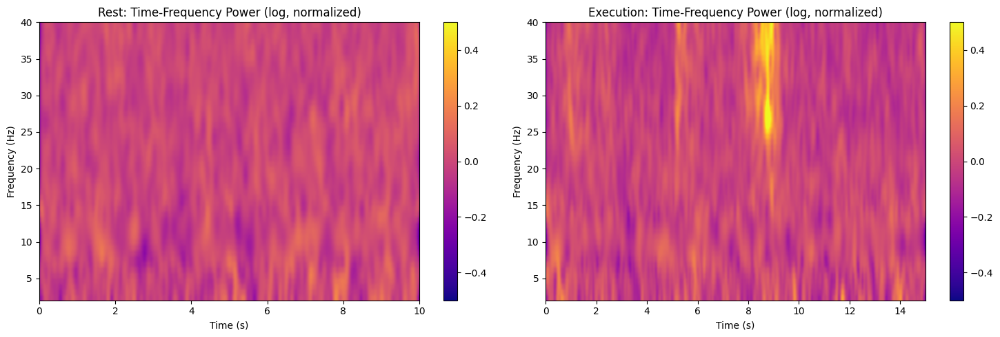

In [5]:
# Усреднение по эпохам
rest_avg = rest_spec_arr.mean(axis=0)  # (n_freqs, n_times)
exec_avg = exec_spec_arr.mean(axis=0)  # (n_freqs, n_times)

# Логарифм и нормализация
rest_log = np.log10(rest_avg + 1e-10)
exec_log = np.log10(exec_avg + 1e-10)

rest_norm = rest_log - rest_log.mean(axis=1, keepdims=True)
exec_norm = exec_log - exec_log.mean(axis=1, keepdims=True)

# Визуализация
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

im0 = axs[0].imshow(rest_norm, aspect='auto', cmap='plasma',
                    extent=[times_rest[0], times_rest[-1], freqs[0], freqs[-1]],
                    origin='lower', vmin=-0.5, vmax=0.5)
axs[0].set_title('Rest: Time-Frequency Power (log, normalized)')
axs[0].set_xlabel('Time (s)')
axs[0].set_ylabel('Frequency (Hz)')
fig.colorbar(im0, ax=axs[0])

im1 = axs[1].imshow(exec_norm, aspect='auto', cmap='plasma',
                    extent=[times_exec[0], times_exec[-1], freqs[0], freqs[-1]],
                    origin='lower', vmin=-0.5, vmax=0.5)
axs[1].set_title('Execution: Time-Frequency Power (log, normalized)')
axs[1].set_xlabel('Time (s)')
axs[1].set_ylabel('Frequency (Hz)')
fig.colorbar(im1, ax=axs[1])

plt.tight_layout()
plt.show()

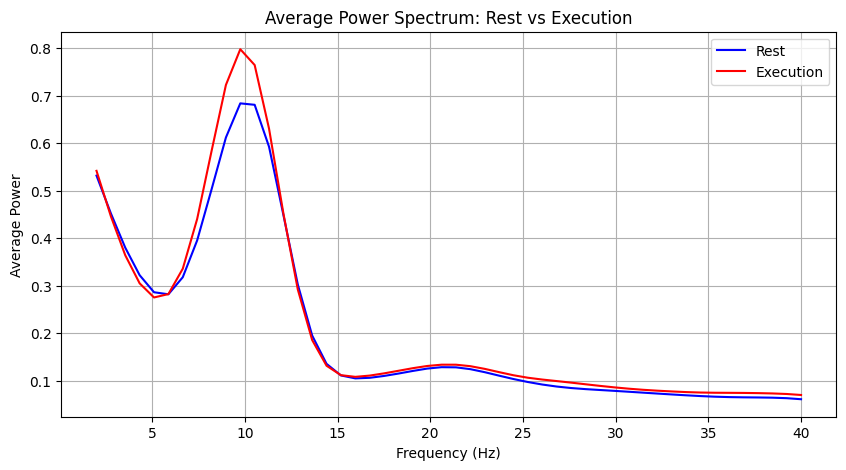

In [6]:
# Усреднение по эпохам
rest_avg = rest_spec_arr.mean(axis=0)  # shape: (n_freqs, n_times)
exec_avg = exec_spec_arr.mean(axis=0)

# усреднение по времени → просто спектр
rest_spectrum = rest_avg.mean(axis=1)  # shape: (n_freqs,)
exec_spectrum = exec_avg.mean(axis=1)

plt.figure(figsize=(10, 5))
plt.plot(freqs, rest_spectrum, label='Rest', color='blue')
plt.plot(freqs, exec_spectrum, label='Execution', color='red')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Average Power')
plt.title('Average Power Spectrum: Rest vs Execution')
plt.legend()
plt.grid(True)
plt.show()

### Detailed Execution / Rest Topomaps for Particular Freq Region

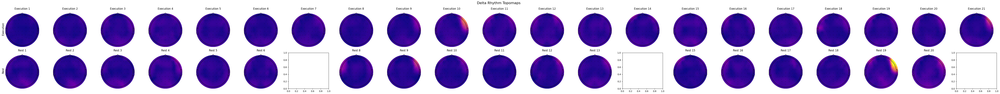

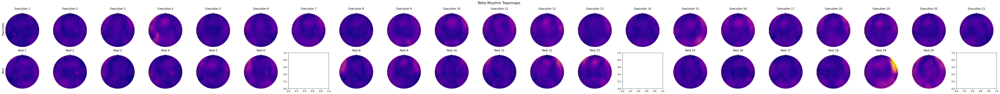

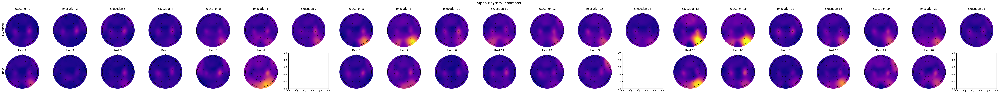

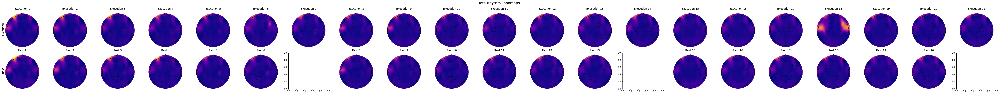

In [11]:
import mne
import numpy as np
import matplotlib.pyplot as plt

# Частота интереса

# # DELTA (1-4)
# target_freq = 2.5
# tolerance = 1.5  # ширина окна вокруг целевой частоты

# # THETTA (4-7)
# target_freq = 5.5
# tolerance = 1.5  # ширина окна вокруг целевой частоты

# # ALPHA (8-13) TODO (узко верх вниз)
# target_freq = 10.5
# tolerance = 2.5  # ширина окна вокруг целевой частоты

# # BETA (14-30) TODO (узко верх вниз)
# target_freq = 22
# tolerance = 8  # ширина окна вокруг целевой частоты

target_freq_arr = [2.5, 5.5, 10.5, 22]
tolerance_arr = [1.5, 1.5, 2.5, 8]
rythm_name_arr = ["Delta", "Tetta", "Alpha", "Beta"]

for target_freq, tolerance, rythm_name in zip(target_freq_arr, tolerance_arr, rythm_name_arr):
    # Подготовка списков блоков
    execution_blocks = [
        (block_data['timestamp'], block_data['content']['duration'])
        for block_data in experiment_seq.values()
        if block_data['type'] == 'execution'
    ]
    
    rest_blocks = [
        (block_data['timestamp'], block_data['content']['duration'])
        for block_data in experiment_seq.values()
        if block_data['type'] == 'rest' and block_data['content']['duration'] == 10
    ]
    
    # Функция для получения топомапа по частоте в диапозоне
    def get_band_power_topo(raw_segment, freq, tol=0.5):
        psd = raw_segment.compute_psd(fmax=freq+tol+1, method='welch', average='mean')
        freqs = psd.freqs
        idx_band = np.where((freqs >= freq - tol) & (freqs <= freq + tol))[0]
        psd_data = psd.get_data()
        psd_band = psd_data[:, idx_band].mean(axis=1)  # среднее по диапазону
        return psd_band
    
    # Вычисляем все топомапы
    execution_topos = []
    for start_time, duration in execution_blocks:
        tmin = start_time
        tmax = min(start_time + duration, raw.times[-1] - 0.001)
        segment = raw.copy().crop(tmin=tmin, tmax=tmax)
        topo = get_band_power_topo(segment, target_freq, tolerance)
        execution_topos.append(topo)
    
    rest_topos = []
    for start_time, duration in rest_blocks:
        tmin = start_time
        tmax = min(start_time + duration, raw.times[-1] - 0.001)
        segment = raw.copy().crop(tmin=tmin, tmax=tmax)
        topo = get_band_power_topo(segment, target_freq, tolerance)
        rest_topos.append(topo)
    
    # Определим общий min/max для нормализации цветовой шкалы
    all_topos = execution_topos + rest_topos
    vmin = min([t.min() for t in all_topos])
    vmax = max([t.max() for t in all_topos])
    
    # Рисуем топомапы
    n_exec = len(execution_topos)
    n_rest = len(rest_topos)
    
    fig, axes = plt.subplots(2, max(n_exec, n_rest), figsize=(3 * max(n_exec, n_rest), 6))
    
    # Execution
    for i, psds_band in enumerate(execution_topos):
        ax = axes[0, i] if n_exec > 1 else axes[0]
        mne.viz.plot_topomap(
            psds_band, raw.info, axes=ax, show=False,
            cmap='plasma', contours=0, vlim=(vmin, vmax)
        )
        ax.set_title(f'Execution {i+1}')
    
    # Rest
    for i, psds_band in enumerate(rest_topos):
        if i>=6:
            i+=1
            if i>=13:
                i+=1
        ax = axes[1, i] if n_rest > 1 else axes[1]
        mne.viz.plot_topomap(
            psds_band, raw.info, axes=ax, show=False,
            cmap='plasma', contours=0, vlim=(vmin, vmax)
        )
        ax.set_title(f'Rest {i+1}')
    
    axes[0, 0].set_ylabel('Execution', fontsize=12)
    axes[1, 0].set_ylabel('Rest', fontsize=12)

    fig.suptitle(f'{rythm_name} Rhythm Topomaps', fontsize=16)
    
    plt.tight_layout()
    plt.savefig(f'{rythm_name}_Localization.png')
    plt.show()

0it [00:00, ?it/s]/tmp/ipykernel_42966/1245538886.py:60: RuntimeWarning: This filename (Generated/Data/S_4/Trial_2/EEG_clean.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(eeg_clean_path , preload=True, verbose=False)
1it [00:14, 14.91s/it]/tmp/ipykernel_42966/1245538886.py:60: RuntimeWarning: This filename (Generated/Data/S_4/Trial_1/EEG_clean.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(eeg_clean_path , preload=True, verbose=False)
2it [00:30, 15.04s/it]/tmp/ipykernel_42966/1245538886.py:60: RuntimeWarning: This filename (Generated/Data/S_1/Trial_2/EEG_clean.fif) 

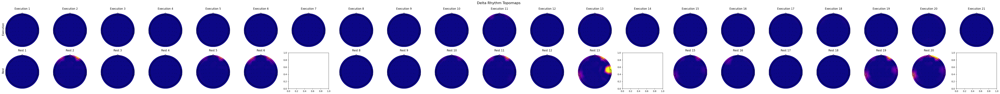

1it [00:20, 20.42s/it]

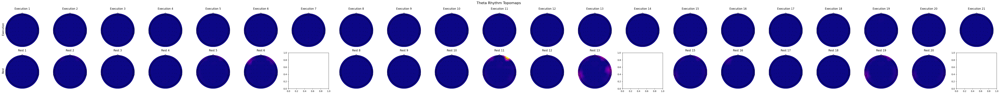

2it [00:40, 19.97s/it]

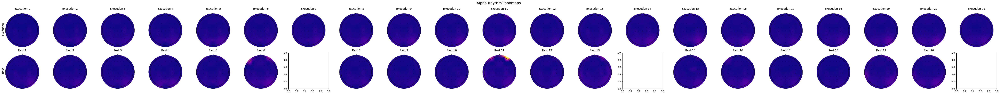

3it [00:59, 19.85s/it]

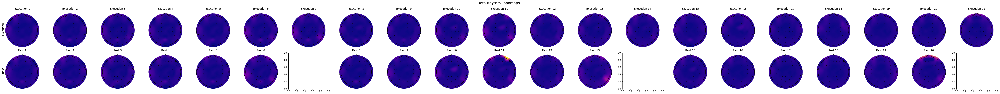

4it [01:19, 19.93s/it]


In [3]:
# Корневая папка с данными по субъектам и трейлам
root_dir = "Generated/Data"
valid_dirs = []

# Регулярка для S_директорий: S_ и только цифры после
s_dir_pattern = re.compile(r"^S_\d+$")
# Регулярка для Trial_директорий: Trial_ и только цифры
trial_dir_pattern = re.compile(r"^Trial_\d+$")

def collect_valid_paths():
    """
    Сканируем root_dir и собираем полные пути до тех папок Trial_<число>,
    где внутри есть хотя бы один файл.
    """
    for s_dir in os.listdir(root_dir):
        s_path = os.path.join(root_dir, s_dir)
        if os.path.isdir(s_path) and s_dir_pattern.match(s_dir):
            for trial_dir in os.listdir(s_path):
                trial_path = os.path.join(s_path, trial_dir)
                if os.path.isdir(trial_path) and trial_dir_pattern.match(trial_dir):
                    # Проверяем, есть ли хотя бы один файл внутри
                    if any(os.path.isfile(os.path.join(trial_path, f)) for f in os.listdir(trial_path)):
                        valid_dirs.append(trial_path)
    return valid_dirs




# Собираем все валидные пути к папкам Trial_<id>
all_trial_paths = collect_valid_paths()

# Частоты и толеранс для четырёх ритмов
target_freq_arr = [2.5, 5.5, 10.5, 22]
tolerance_arr   = [1.5, 1.5, 2.5, 8]
rythm_name_arr  = ["Delta", "Theta", "Alpha", "Beta"]



# Подготовка списков блоков
execution_blocks = [
    (block_data['timestamp'], block_data['content']['duration'])
    for block_data in experiment_seq.values()
    if block_data['type'] == 'execution'
]

rest_blocks = [
    (block_data['timestamp'], block_data['content']['duration'])
    for block_data in experiment_seq.values()
    if block_data['type'] == 'rest' and block_data['content']['duration'] == 10
]

rest_eeg_segments = []   # 21 segments merged from all trials 
exec_eeg_segments = []   # 18 segments merged from all trials

for i, trial_path in tqdm(enumerate(all_trial_paths)):

    eeg_clean_path = f"{trial_path}/EEG_clean.fif"
    
    # Load the .fif file
    raw = mne.io.read_raw_fif(eeg_clean_path , preload=True, verbose=False)
    raw.pick_types(eeg=True, verbose=False)  # только EEG-каналы
    sr = int(raw.info['sfreq'])  # sampling rate
    
    if i == 0:
        # Append the segments to list
        for start_time, duration in execution_blocks:
            tmin = start_time
            tmax = min(start_time + duration, raw.times[-1] - 0.001)
            segment = raw.copy().crop(tmin=tmin, tmax=tmax)
            exec_eeg_segments.append(segment)

        for start_time, duration in rest_blocks:
            tmin = start_time
            tmax = min(start_time + duration, raw.times[-1] - 0.001)
            segment = raw.copy().crop(tmin=tmin, tmax=tmax)
            rest_eeg_segments.append(segment)

    else:
        # Append segments to existing segments by concatenating data
        for idx, (start_time, duration) in enumerate(execution_blocks):
            tmin = start_time
            tmax = min(start_time + duration, raw.times[-1] - 0.001)
            segment = raw.copy().crop(tmin=tmin, tmax=tmax)
            # Append data across trials (concat along time)
            exec_eeg_segments[idx] = mne.concatenate_raws([exec_eeg_segments[idx], segment])

        for idx, (start_time, duration) in enumerate(rest_blocks):
            tmin = start_time
            tmax = min(start_time + duration, raw.times[-1] - 0.001)
            segment = raw.copy().crop(tmin=tmin, tmax=tmax)
            # Append data across trials (concat along time)
            rest_eeg_segments[idx] = mne.concatenate_raws([rest_eeg_segments[idx], segment])
    
    
    


for target_freq, tolerance, rythm_name in tqdm(zip(target_freq_arr, tolerance_arr, rythm_name_arr)):

    # Функция для получения топомапа по частоте в диапозоне
    def get_band_power_topo(raw_segment, freq, tol=0.5):
        psd = raw_segment.compute_psd(fmax=freq+tol+1, method='welch', average='mean')
        freqs = psd.freqs
        idx_band = np.where((freqs >= freq - tol) & (freqs <= freq + tol))[0]
        psd_data = psd.get_data()
        psd_band = psd_data[:, idx_band].mean(axis=1)  # среднее по диапазону
        return psd_band
    
    # Вычисляем все топомапы
    execution_topos = []
    for segment in exec_eeg_segments:
        topo = get_band_power_topo(segment, target_freq, tolerance)
        execution_topos.append(topo)
    
    rest_topos = []
    for segment in rest_eeg_segments:
        topo = get_band_power_topo(segment, target_freq, tolerance)
        rest_topos.append(topo)
    
    # Определим общий min/max для нормализации цветовой шкалы
    all_topos = execution_topos + rest_topos
    vmin = min([t.min() for t in all_topos])
    vmax = max([t.max() for t in all_topos])
    
    # Рисуем топомапы
    n_exec = len(execution_topos)
    n_rest = len(rest_topos)
    
    fig, axes = plt.subplots(2, max(n_exec, n_rest), figsize=(3 * max(n_exec, n_rest), 6))
    
    # Execution
    for i, psds_band in enumerate(execution_topos):
        ax = axes[0, i] if n_exec > 1 else axes[0]
        mne.viz.plot_topomap(
            psds_band, raw.info, axes=ax, show=False,
            cmap='plasma', contours=0, vlim=(vmin, vmax)
        )
        ax.set_title(f'Execution {i+1}')
    
    # Rest
    for i, psds_band in enumerate(rest_topos):
        if i>=6:
            i+=1
            if i>=13:
                i+=1
        ax = axes[1, i] if n_rest > 1 else axes[1]
        mne.viz.plot_topomap(
            psds_band, raw.info, axes=ax, show=False,
            cmap='plasma', contours=0, vlim=(vmin, vmax)
        )
        ax.set_title(f'Rest {i+1}')
    
    axes[0, 0].set_ylabel('Execution', fontsize=12)
    axes[1, 0].set_ylabel('Rest', fontsize=12)

    fig.suptitle(f'{rythm_name} Rhythm Topomaps', fontsize=16)
    
    plt.tight_layout()
    plt.savefig(f'{rythm_name}_Localization.png')
    plt.show()

In [25]:
for target_freq, tolerance, rythm_name in tqdm(zip(target_freq_arr, tolerance_arr, rythm_name_arr)):

    # Функция для получения топомапа по частоте в диапозоне
    def get_band_power_topo(raw_segment, freq, tol=0.5):
        psd = raw_segment.compute_psd(fmax=freq+tol+1, method='welch', average='mean')
        freqs = psd.freqs
        idx_band = np.where((freqs >= freq - tol) & (freqs <= freq + tol))[0]
        psd_data = psd.get_data()
        psd_band = psd_data[:, idx_band].mean(axis=1)  # среднее по диапазону
        return psd_band
    
    # Вычисляем все топомапы
    execution_topos = []
    for segment in exec_eeg_segments:
        topo = get_band_power_topo(segment, target_freq, tolerance)
        execution_topos.append(topo)
    
    rest_topos = []
    for segment in rest_eeg_segments:
        topo = get_band_power_topo(segment, target_freq, tolerance)
        rest_topos.append(topo)
    
    # Определим общий min/max для нормализации цветовой шкалы
    all_values = np.concatenate(all_topos)
    
    # Берём 5-й и 95-й перцентиль
    vmin = np.percentile(all_values, 5)
    vmax = np.percentile(all_values, 95)
    
    # Рисуем топомапы
    n_exec = len(execution_topos)
    n_rest = len(rest_topos)
    
    fig, axes = plt.subplots(2, max(n_exec, n_rest), figsize=(3 * max(n_exec, n_rest), 6))
    
    # Execution
    for i, psds_band in enumerate(execution_topos):
        ax = axes[0, i] if n_exec > 1 else axes[0]
        mne.viz.plot_topomap(
            psds_band, raw.info, axes=ax, show=False,
            cmap='plasma', contours=0, vlim=(vmin, vmax)
        )
        ax.set_title(f'Execution {i+1}')
    
    # Rest
    for i, psds_band in enumerate(rest_topos):
        if i>=6:
            i+=1
            if i>=13:
                i+=1
        ax = axes[1, i] if n_rest > 1 else axes[1]
        mne.viz.plot_topomap(
            psds_band, raw.info, axes=ax, show=False,
            cmap='plasma', contours=0, vlim=(vmin, vmax)
        )
        ax.set_title(f'Rest {i+1}')
    
    axes[0, 0].set_ylabel('Execution', fontsize=12)
    axes[1, 0].set_ylabel('Rest', fontsize=12)

    fig.suptitle(f'{rythm_name} Rhythm Topomaps', fontsize=16)
    
    plt.tight_layout()
    plt.savefig(f'{rythm_name}_Localization.png')
    plt.show()

0it [00:05, ?it/s]
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7186a3f2c670>>
Traceback (most recent call last):
  File "/home/leon/.local/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 

KeyboardInterrupt



0it [00:00, ?it/s]

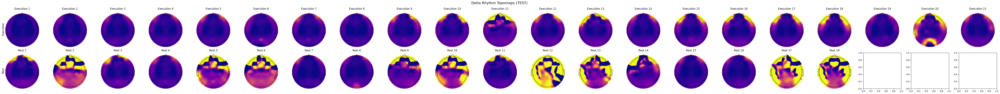

1it [00:19, 19.94s/it]

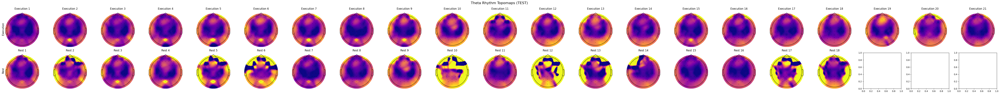

2it [00:39, 19.84s/it]

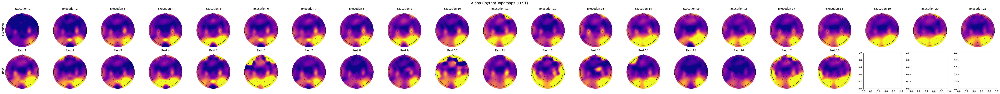

3it [00:59, 19.91s/it]

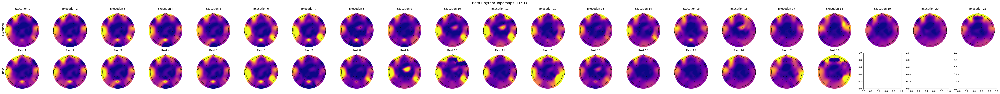

4it [01:19, 19.94s/it]


In [27]:
for target_freq, tolerance, rythm_name in tqdm(zip(target_freq_arr, tolerance_arr, rythm_name_arr)):

    def get_band_power_topo(raw_segment, freq, tol=0.5):
        psd = raw_segment.compute_psd(fmax=freq+tol+1, method='welch', average='mean')
        freqs = psd.freqs
        idx_band = np.where((freqs >= freq - tol) & (freqs <= freq + tol))[0]
        psd_data = psd.get_data()
        psd_band = psd_data[:, idx_band].mean(axis=1)
        return psd_band

    execution_topos = [get_band_power_topo(segment, target_freq, tolerance) for segment in exec_eeg_segments]
    rest_topos = [get_band_power_topo(segment, target_freq, tolerance) for segment in rest_eeg_segments]

    # Объединяем все значения для текущей частоты
    all_values = np.concatenate(execution_topos + rest_topos)

    # Берём адаптивные 5-й и 95-й перцентили
    vmin = np.percentile(all_values, 5)
    vmax = np.percentile(all_values, 95)

    n_exec = len(execution_topos)
    n_rest = len(rest_topos)
    n_cols = max(n_exec, n_rest)

    fig, axes = plt.subplots(2, n_cols, figsize=(3 * n_cols, 6))

    if n_cols == 1:
        axes = np.array([[axes[0]], [axes[1]]])

    # Execution
    for i, psds_band in enumerate(execution_topos):
        ax = axes[0, i]
        mne.viz.plot_topomap(
            psds_band, raw.info, axes=ax, show=False,
            cmap='plasma', contours=0, vlim=(vmin, vmax)
        )
        ax.set_title(f'Execution {i+1}')

    # Rest
    for i, psds_band in enumerate(rest_topos):
        ax = axes[1, i]
        mne.viz.plot_topomap(
            psds_band, raw.info, axes=ax, show=False,
            cmap='plasma', contours=0, vlim=(vmin, vmax)
        )
        ax.set_title(f'Rest {i+1}')

    axes[0, 0].set_ylabel('Execution', fontsize=12)
    axes[1, 0].set_ylabel('Rest', fontsize=12)

    fig.suptitle(f'{rythm_name} Rhythm Topomaps (TEST)', fontsize=16)

    plt.tight_layout()
    plt.savefig(f'{rythm_name}_Localization.png')
    plt.show()
